In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


df = pd.read_csv(r"C:\Users\ralph\OneDrive\Desktop\jupyter\OOP\data\countries of the world.csv")
df.head()
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227 entries, 0 to 226
Data columns (total 20 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Country                             227 non-null    object 
 1   Region                              227 non-null    object 
 2   Population                          227 non-null    int64  
 3   Area (sq. mi.)                      227 non-null    int64  
 4   Pop. Density (per sq. mi.)          227 non-null    object 
 5   Coastline (coast/area ratio)        227 non-null    object 
 6   Net migration                       224 non-null    object 
 7   Infant mortality (per 1000 births)  224 non-null    object 
 8   GDP ($ per capita)                  226 non-null    float64
 9   Literacy (%)                        209 non-null    object 
 10  Phones (per 1000)                   223 non-null    object 
 11  Arable (%)                          225 non-n

,Population,Area (sq. mi.),GDP ($ per capita)
count,2.270000e+02,2.270000e+02,226.000000
mean,2.874028e+07,5.982270e+05,9689.823009
std,1.178913e+08,1.790282e+06,10049.138513
min,7.026000e+03,2.000000e+00,500.000000
25%,4.376240e+05,4.647500e+03,1900.000000
50%,4.786994e+06,8.660000e+04,5550.000000
75%,1.749777e+07,4.418110e+05,15700.000000
max,1.313974e+09,1.707520e+07,55100.000000


# Population Analysis

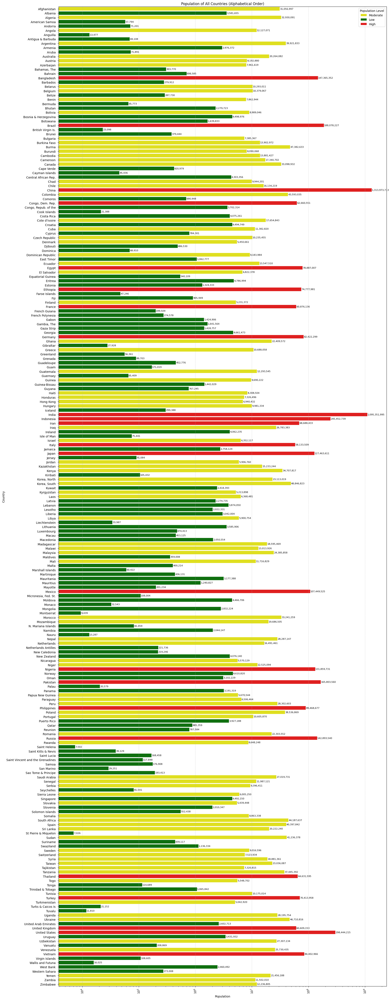

In [2]:
df_sorted = df[['Country', 'Population']].copy()

# Step 3: Create population level column
df_sorted['Population_Level'] = df_sorted['Population'].apply(
    lambda pop: 'Low' if pop < 5_000_000 
    else 'Moderate' if pop < 50_000_000 
    else 'High'
)

df_alpha = df_sorted.sort_values(by='Country')

# Step 5: Plot
plt.figure(figsize=(20,60))
sns.barplot(
    x='Population', 
    y='Country', 
    hue='Population_Level', 
    data=df_alpha, 
    dodge=False,
    palette={'Low':'green','Moderate':'yellow','High':'red'}
)

for i, row in enumerate(df_alpha.itertuples()):
    plt.text(row.Population + row.Population*0.01, i, f"{row.Population:,}", va='center', fontsize=8)

plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.xscale('log')
plt.xticks(rotation=90)
plt.xlabel("Population")
plt.ylabel("Country")
plt.title("Population of All Countries (Alphabetical Order)")
plt.legend(title='Population Level')
plt.show()


# Regional Analysis

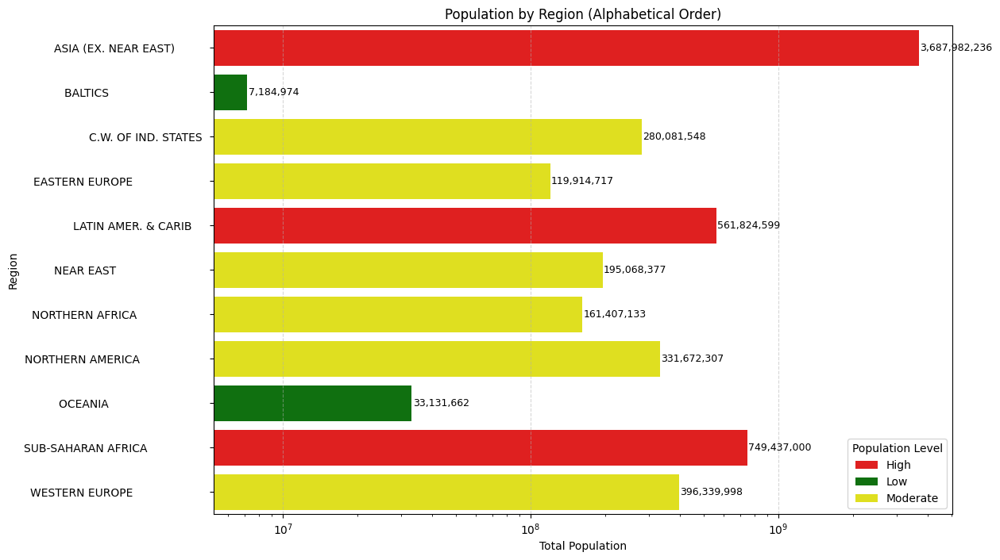

In [3]:
region_df = df.groupby('Region')['Population'].sum().reset_index()

region_df['Population_Level'] = region_df['Population'].apply(
    lambda pop: 'Low' if pop < 50_000_000 
    else 'Moderate' if pop < 500_000_000 
    else 'High'
)

region_df = region_df.sort_values(by='Region')

plt.figure(figsize=(12,8))
sns.barplot(
    x='Population', 
    y='Region', 
    hue='Population_Level', 
    data=region_df, 
    dodge=False,
    palette={'Low':'green','Moderate':'yellow','High':'red'}
)

for i, row in enumerate(region_df.itertuples()):
    plt.text(row.Population + row.Population*0.01, i, f"{row.Population:,}", va='center', fontsize=9)

plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.xscale('log')
plt.xlabel("Total Population")
plt.ylabel("Region")
plt.title("Population by Region (Alphabetical Order)")
plt.legend(title='Population Level')
plt.show()


# correlations

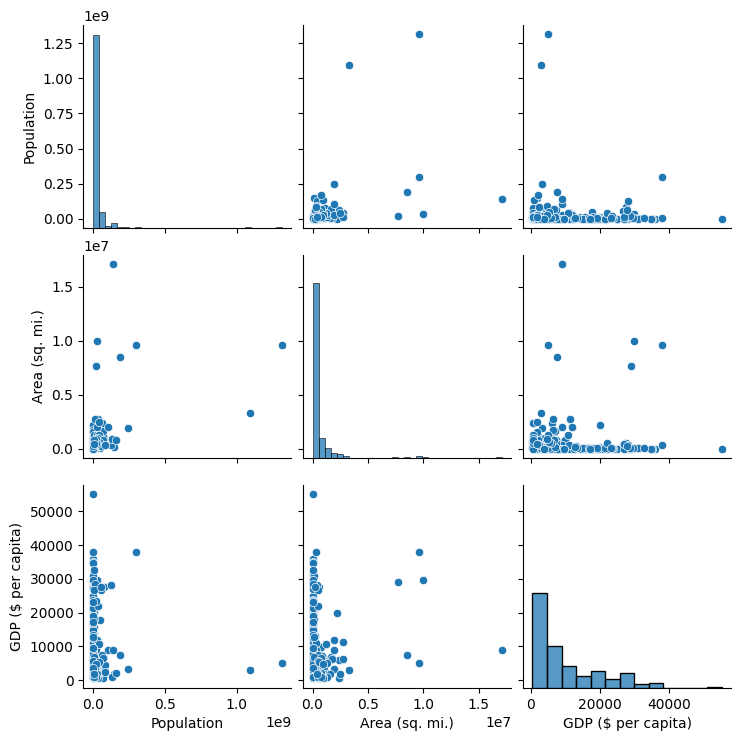

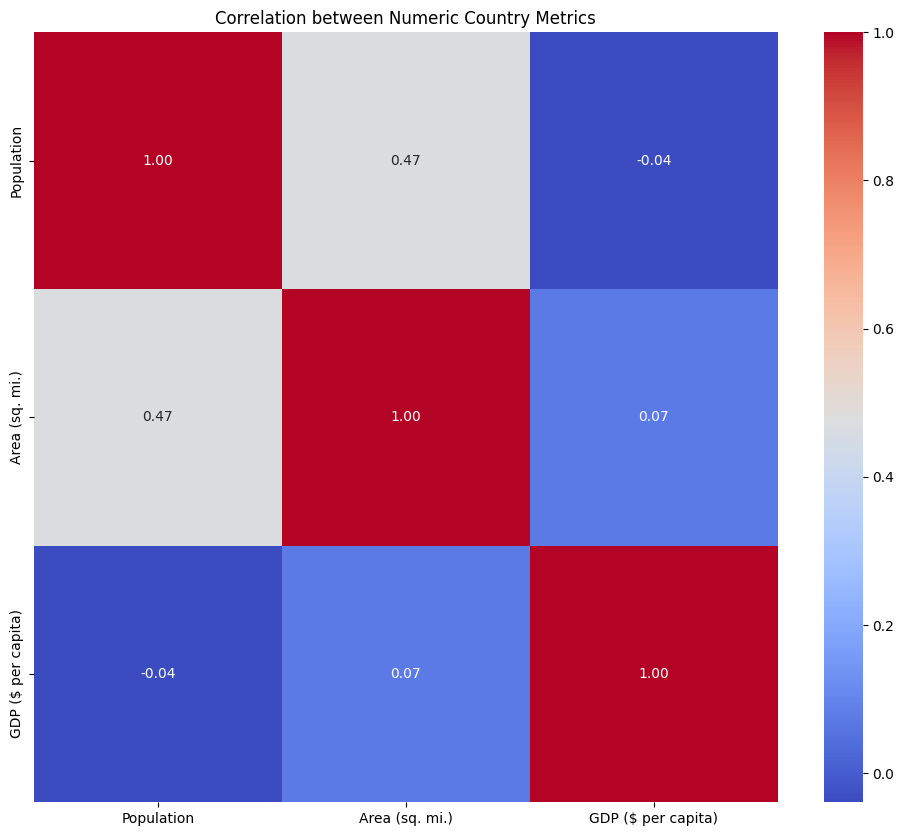

In [4]:
numeric_df = df.select_dtypes(include=['int64', 'float64']).copy()

numeric_df = numeric_df.dropna(axis=1, how='all')

sns.pairplot(numeric_df)
plt.show()

corr_matrix = numeric_df.corr()

plt.figure(figsize=(12,10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation between Numeric Country Metrics")
plt.show()


# birthrate adn deathrate

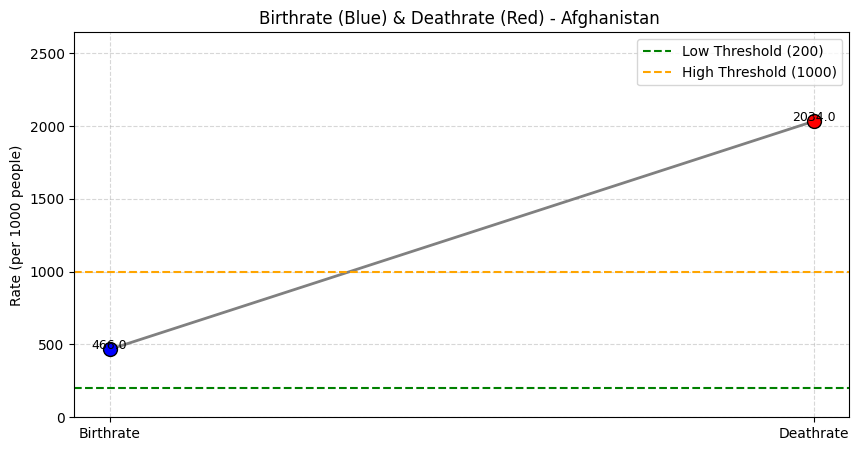

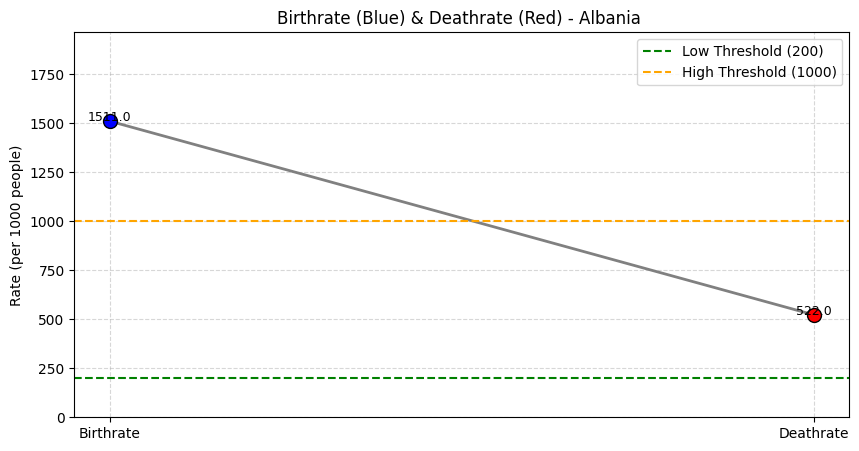

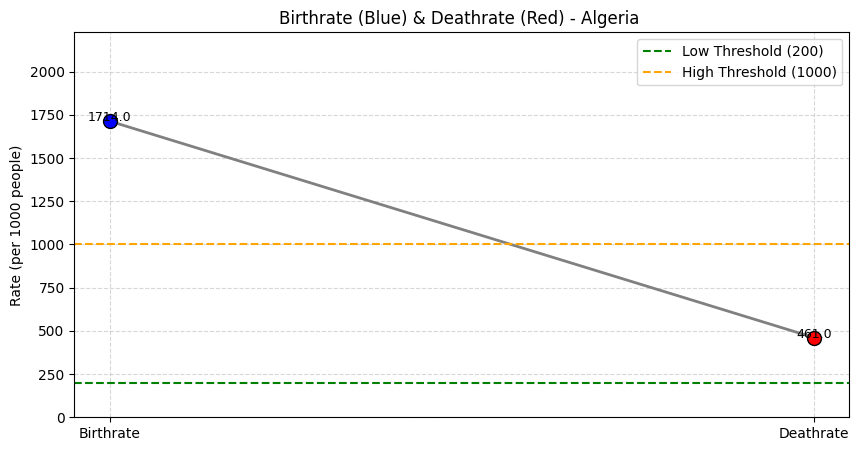

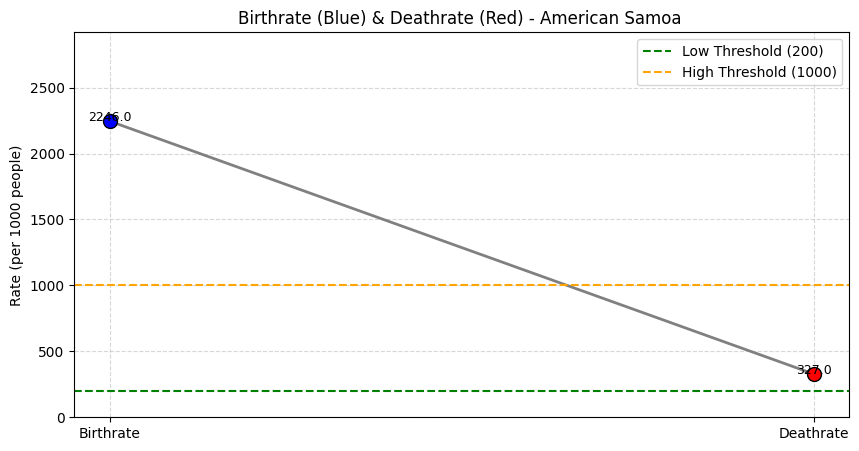

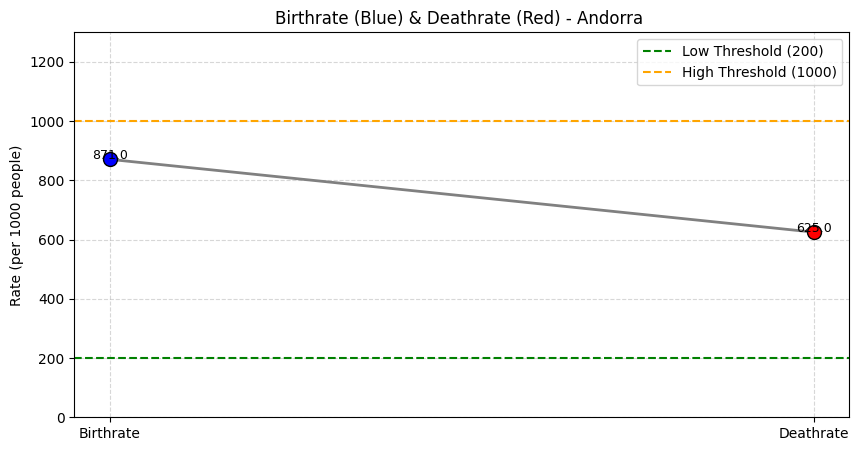

...

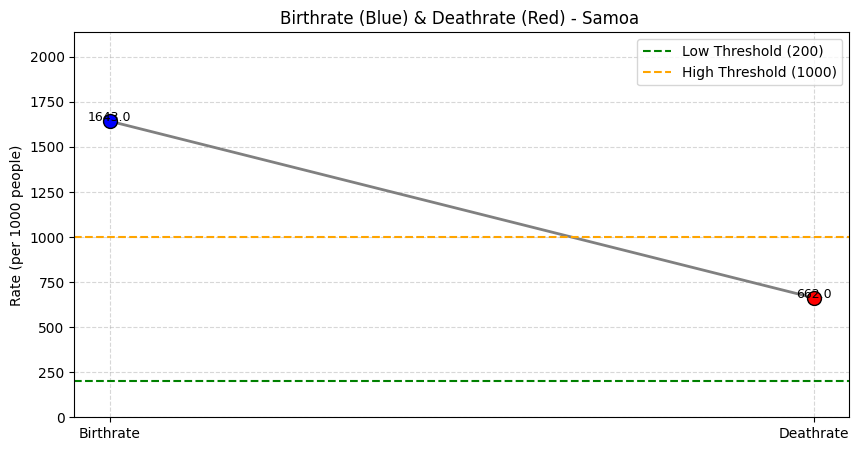

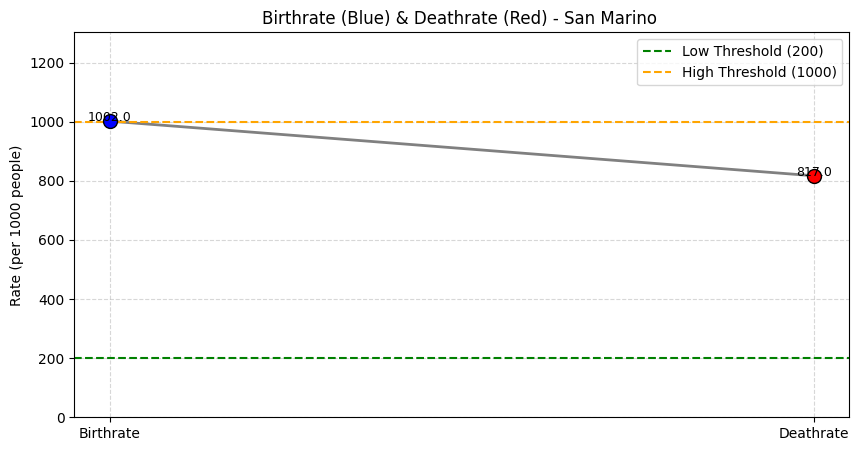

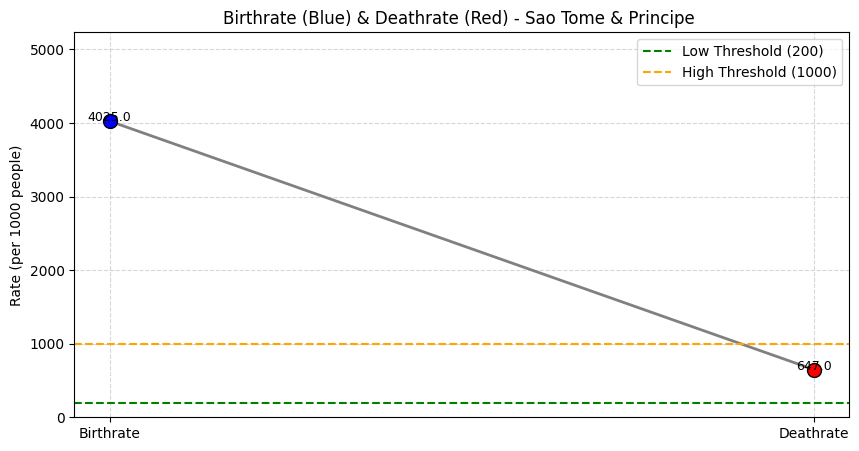

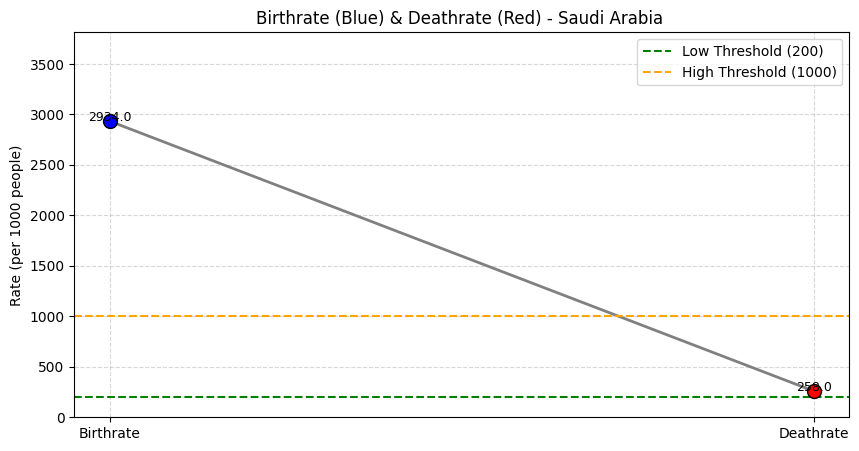

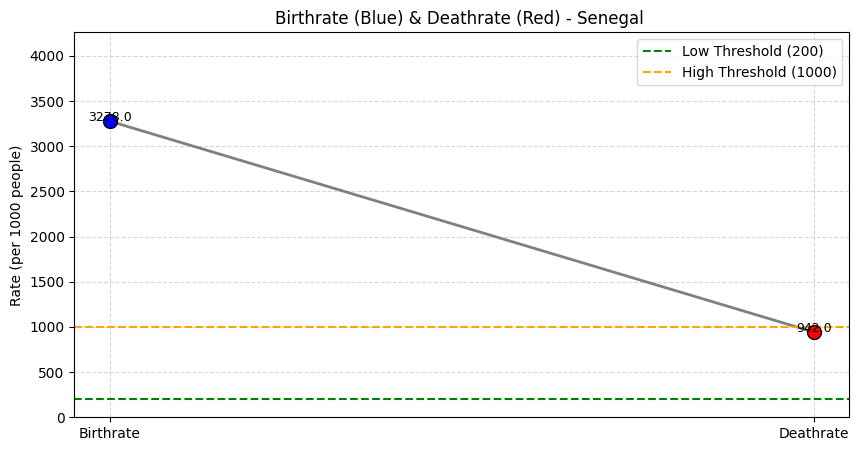

Skipping Serbia  due to missing data.


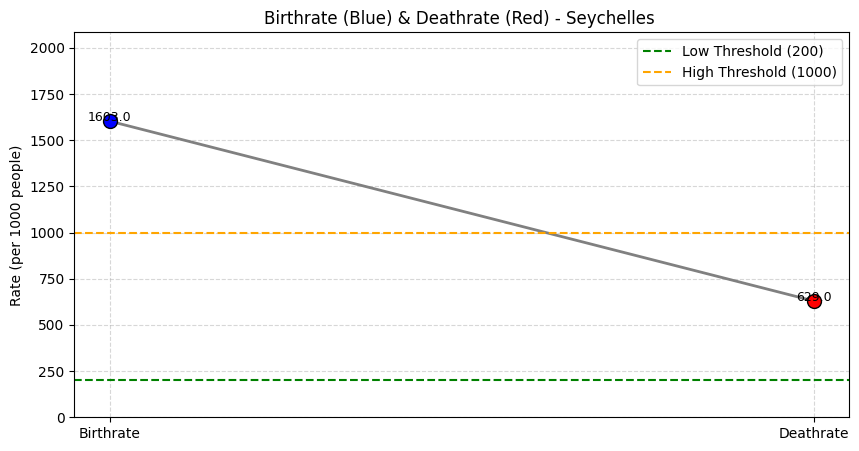

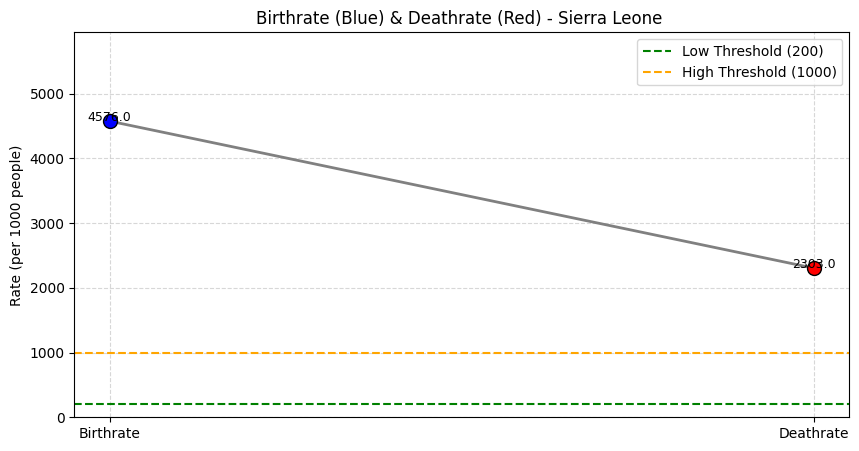

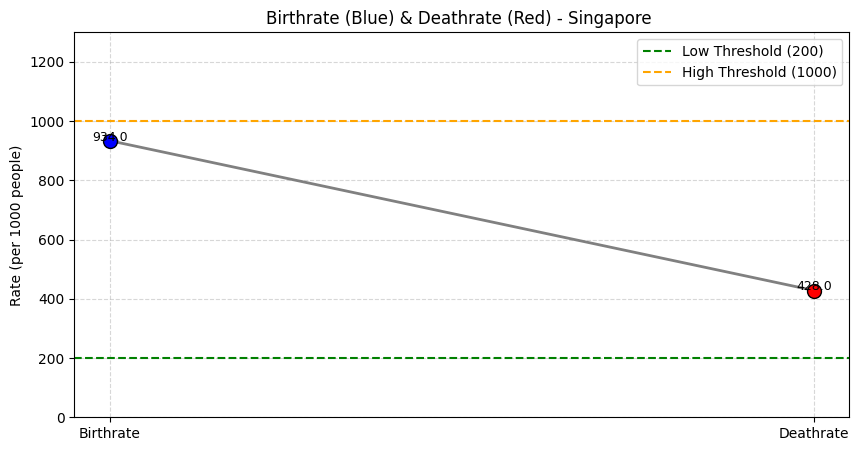

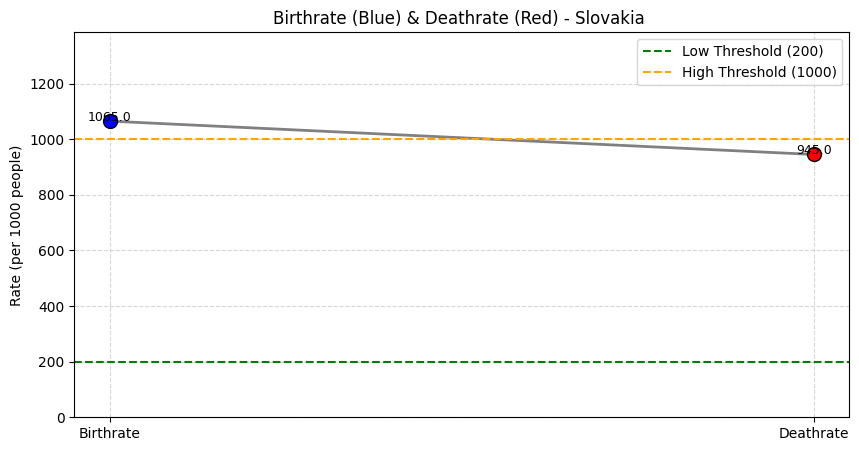

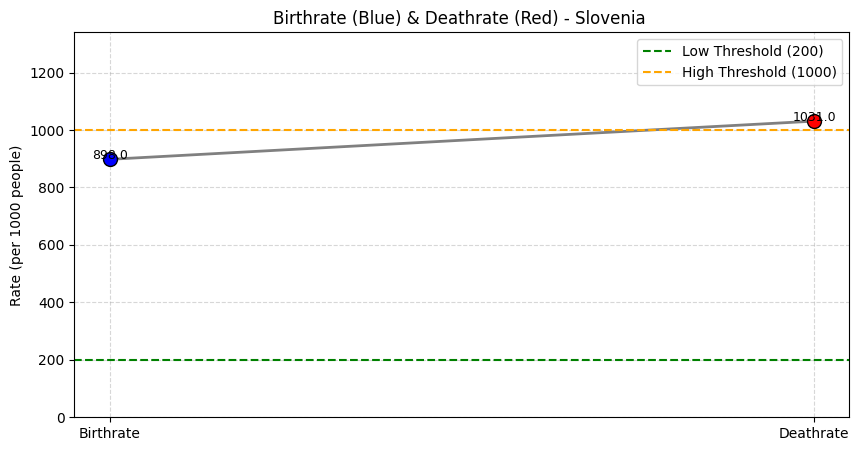

...

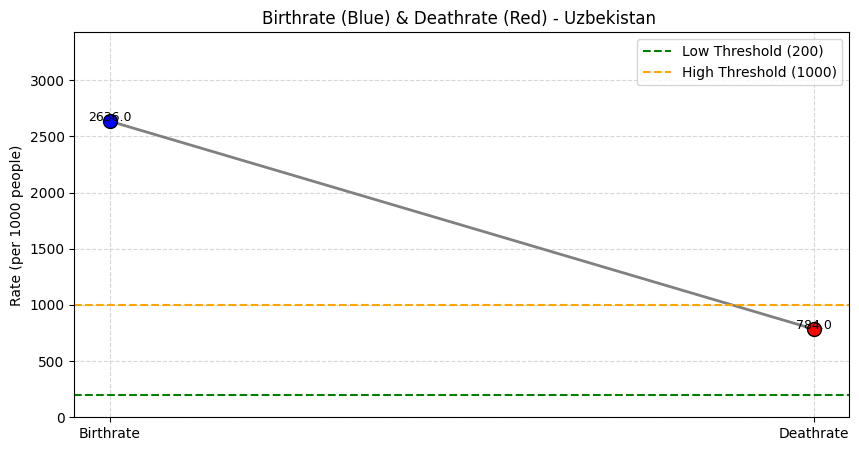

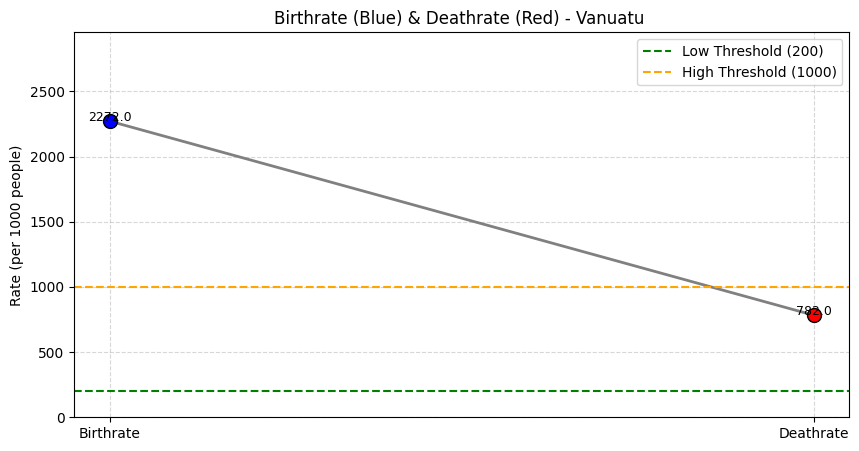

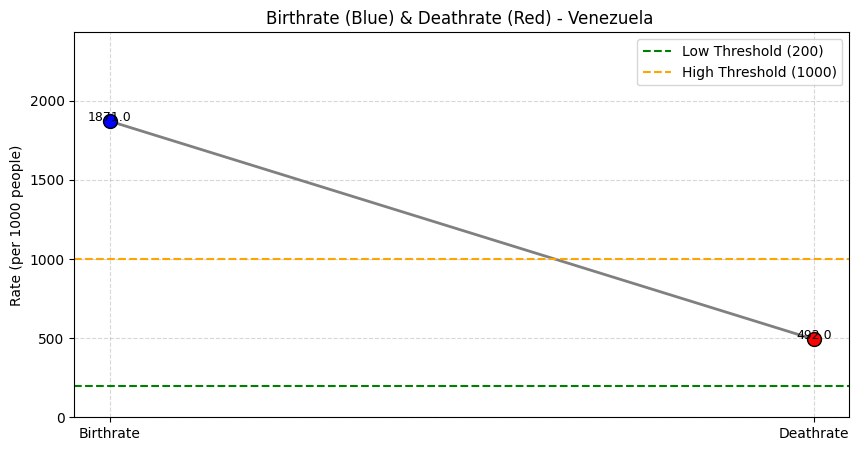

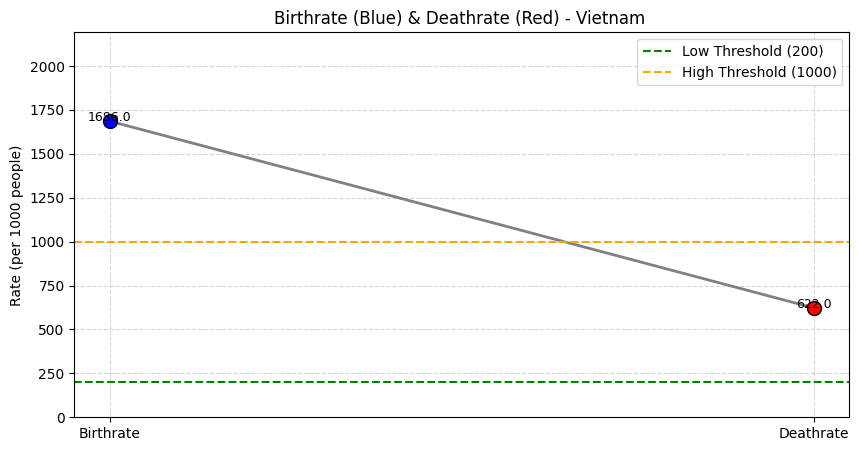

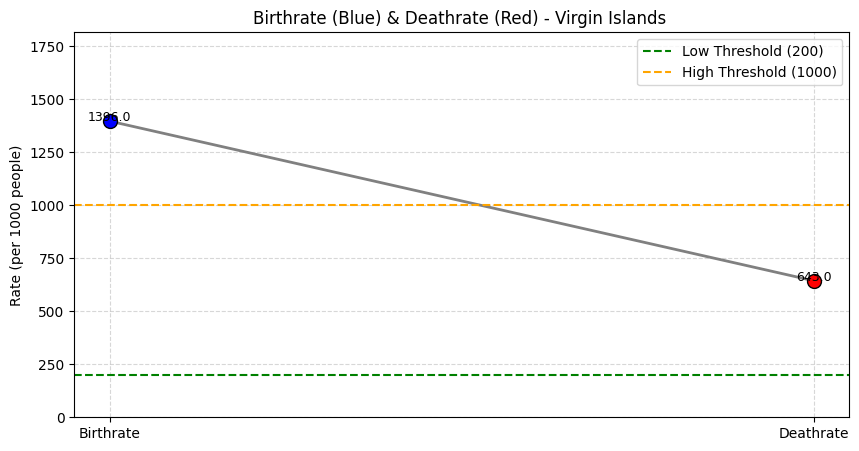

Skipping Wallis and Futuna  due to missing data.


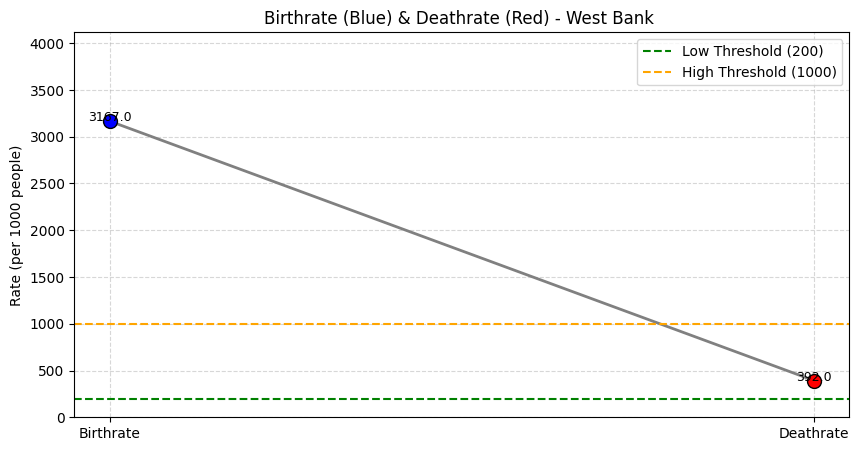

Skipping Western Sahara  due to missing data.


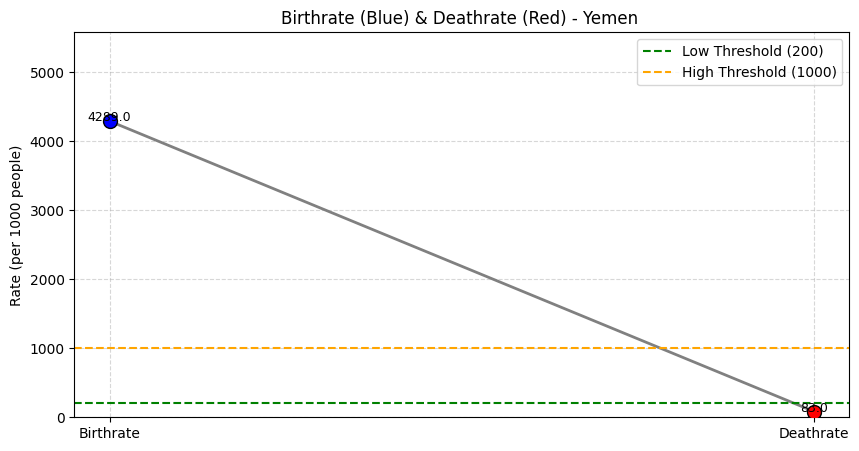

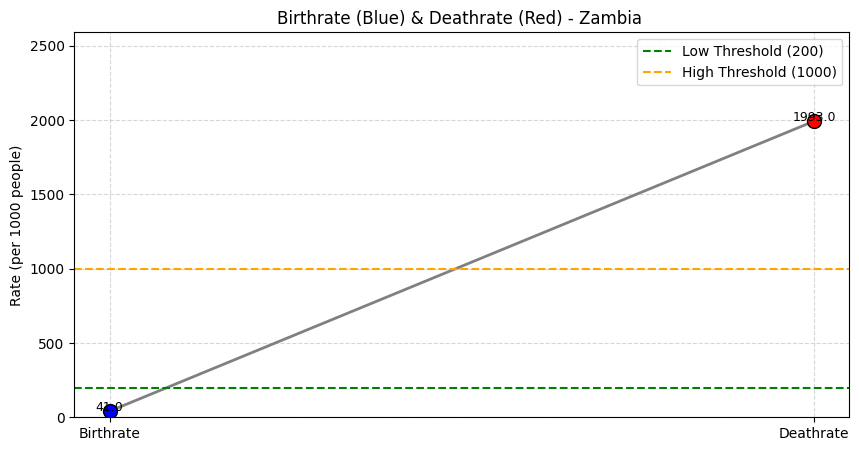

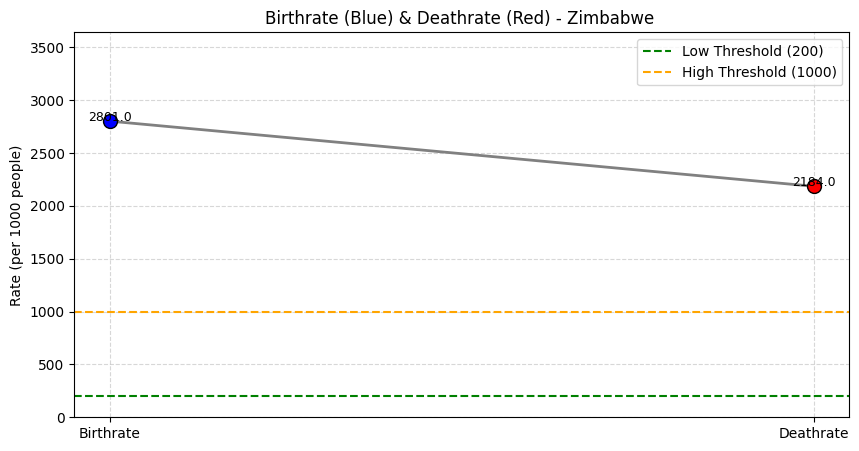

In [5]:
df.columns = df.columns.str.strip()

df['Birthrate'] = pd.to_numeric(
    df['Birthrate'].astype(str)
      .str.replace('\xa0', '', regex=False)
      .str.replace(',', '', regex=False)
      .str.strip(),
    errors='coerce'
)

df['Deathrate'] = pd.to_numeric(
    df['Deathrate'].astype(str)
      .str.replace('\xa0', '', regex=False)
      .str.replace(',', '', regex=False)
      .str.strip(),
    errors='coerce'
)

low_threshold = 200
high_threshold = 1000

for country in df['Country'].sort_values():
    country_data = df[df['Country'] == country].iloc[0]
    birth = country_data['Birthrate']
    death = country_data['Deathrate']
    
    if pd.isna(birth) and pd.isna(death):
        print(f"Skipping {country} due to missing data.")
        continue
    
    birth = 0 if pd.isna(birth) else birth
    death = 0 if pd.isna(death) else death
    
    rates = [birth, death]
    rate_names = ['Birthrate', 'Deathrate']
    colors_bg = ['blue', 'red']  # Birth = blue, Death = red
    
    plt.figure(figsize=(10,5))
    plt.plot(rate_names, rates, marker='o', linewidth=2, color='gray')
    
    for i, r in enumerate(rates):
        plt.scatter(rate_names[i], r, s=100, color=colors_bg[i], edgecolor='black', zorder=3)
        plt.text(rate_names[i], r + 0.5, f"{r:.1f}", ha='center', fontsize=9)
    
    # Draw thresholds
    plt.axhline(low_threshold, color='green', linestyle='--', label=f'Low Threshold ({low_threshold})')
    plt.axhline(high_threshold, color='orange', linestyle='--', label=f'High Threshold ({high_threshold})')
    
    plt.title(f"Birthrate (Blue) & Deathrate (Red) - {country}")
    plt.ylabel("Rate (per 1000 people)")
    plt.ylim(0, max(rates + [high_threshold]) * 1.3)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    plt.show()
